In [1]:
%pylab inline
import os
import astropy.io.fits as pyfits
from astropy.table import Table
from configparser import ConfigParser

try:
    import ipyvolume as ipv
except ImportError:
    raise ImportError('install ipyvolume for display') 

import haloSim
from pixel3D import cartesianGrid3D
from sparseBase import massmapSparsityTask

#important constant
C_LIGHT=2.99792458e8        # m/s
GNEWTON=6.67428e-11         # m^3/kg/s^2
KG_PER_SUN=1.98892e30       # kg/M_solar
M_PER_PARSEC=3.08568025e16  # m/pc

Populating the interactive namespace from numpy and matplotlib


In [2]:
cd wrkDir/sim

/work/xiangchong.li/work/massMapSparse/sim


In [3]:
haloCat=Table.read('toy-cosmo/sims/haloCat-202009201646.csv')
# Simulation
iz  =   2
im  =   7
isim=   8
mm=(haloCat['iz']==iz)&(haloCat['im']==im)
hh=haloCat[mm]

z_h=hh['zh']
log_m=hh['log10_M200']
M_200=   10.**(log_m)
conc =   6.02*(M_200/1.E13)**(-0.12)*(1.47/(1.+z_h))**(0.16)
assert conc==hh['conc']

halo =   haloSim.nfw_lensTJ03(mass=M_200,conc=conc,redshift=z_h,ra=0.,dec=0.)
print('redshift is %.2f' %z_h)
print('logM is %.2f' %log_m)

redshift is 0.25
logM is 15.04


In [4]:
# load simualtion
ngroup  =   100
datU=Table.read('HSC-obs/20200328/stampSim_HSClike_mask_shapenoise_photoz-202003282257.fits')
ng=int(len(datU)//ngroup)
datU=datU[isim*ng:(isim+1)*ng]
lensKer= halo.lensKernel(datU['ztrue'])
shearR=  halo.DeltaSigmaComplex(datU['raR']*3600.,datU['decR']*3600.)*lensKer
shearH=  halo.DeltaSigmaComplex(datU['raH']*3600.,datU['decH']*3600.)*lensKer
Sigma=halo.Sigma(datU['raR']*3600.,datU['decR']*3600.)
datU['g1R']=shearR.real
datU['g2R']=shearR.imag
datU['g1H']=shearH.real
datU['g2H']=shearH.imag
datU['Sigma']=Sigma

In [5]:
# Pixelation
ver='pix96-nl20'
zer='pz' #pz/zt
ner='wn' #wn/nn
hdir='./toy-cosmo/pre-run/pixelize-equalNum-%s/' %ver
odir='./'

if not os.path.isdir(hdir):
    os.mkdir(hdir)

outfname1   =  os.path.join(hdir,'pixShearR-g1-%d-%d-%s-%s.fits' %(iz,im,zer,ner))
outfname2   =  os.path.join(hdir,'pixShearR-g2-%d-%d-%s-%s.fits' %(iz,im,zer,ner))
outfname3   =  os.path.join('HSC-obs/20200328/pixes','pixStd.fits')
outfname4   =  'lensing_kernel-%s-%s.fits' %(zer,ver.split('-')[1])

# configuration
configName  =   'config-%s.ini' %ver
parser      =   ConfigParser()
parser.read(configName)
parser.set('prepare','g1fname',outfname1)
parser.set('prepare','g2fname',outfname2)
parser.set('prepare','sigmafname',outfname3)
parser.set('prepare','lkfname',outfname4)
parser.set('file','outDir',odir)

print(parser.get('transPlane','smooth_scale'))
print(parser.get('prepare','g2fname'))

gridInfo    =   cartesianGrid3D(parser)


if not os.path.isfile(outfname1):
    print('preparing the pixelation file')
    g1name  =   'g1R'
    g2name  =   'g2R'
    raname  =   'raR'
    decname =   'decR'
    if zer=='zt':
        zname   =   'ztrue'
    elif zer=='pz':
        zname   =   'zbest'
    if ner=='nn':
        val=(datU[g1name])+(datU[g2name])*1j
    elif ner=='wn':
        val=(datU[g1name]+datU['g1n'])+(datU[g2name]+datU['g2n'])*1j
    outcome=gridInfo.pixelize_data(datU[raname],datU[decname],datU[zname],val)
    pyfits.writeto(outfname1,outcome.real,overwrite=True)
    pyfits.writeto(outfname2,outcome.imag,overwrite=True)
    
dtheta=parser.getfloat('transPlane','scale')*60. #arcsec
print('rs of the input halo is %.3f pixels.' %(halo.rs_arcsec/dtheta))
print('r truncate of the input halo is %.3f pixels.' %(halo.rs_arcsec/dtheta*halo.c))
print('the average density contrast should be %.3f.' %(halo.M/(halo.rs/halo.c)**2./np.pi/halo.Sigma_M_bin(0.51,0.56)))
# lensing kernel
if not os.path.isfile(outfname4):
    print('preparing the lens kernel file')
    datDir='/work/xiangchong.li/work/S16ACatalogs/'
    tn='9347.fits'
    cfn='%s/S16AStandardCalibrated/tract/%s' %(datDir,tn)
    cdata=pyfits.getdata(cfn)
    poz_best=cdata['mlz_photoz_best']
    pfn='%s/S16AStandardCalibrated/tract/%s_pofz.fits' %(datDir,tn.split('.')[0])
    poz_data=pyfits.getdata(pfn)['PDF']
    bfn='%s/S16AStandardV2/field/pz_pdf_bins_mlz.fits' %datDir
    poz_bins=pyfits.getdata(bfn)['BINS']
    if zer=='pz':
        lensKernel= gridInfo.lensing_kernel(poz_grids=poz_bins,poz_data=poz_data,poz_best=poz_best)
    elif zer=='zt':
        lensKernel= gridInfo.lensing_kernel()
    pyfits.writeto(outfname4,lensKernel,overwrite=True)
    
## Noise variance
if not os.path.isfile(outfname3):
    print('preparing the noise std file')
    ngroup=100
    pixDatAll=np.zeros((ngroup,)+gridInfo.shape,dtype=np.complex128)
    for ig in range(ngroup):
        datU=datTab[ig*ng:(ig+1)*ng]
        g1name  =   'g1R'
        g2name  =   'g2R'
        raname  =   'raR'
        decname =   'decR'
        zname   =   'zbest'
        val=(datU[g1name]+datU['g1n'])+(datU[g2name]+datU['g2n'])*1j
        outcome=gridInfo.pixelize_data(datU[raname],datU[decname],datU[zname],val)
        pixDatAll[ig]=outcome
    pixSigmaErr=np.std(pixDatAll,axis=0)
    outfname3   =  os.path.join(hdir,'pixStd.fits')
    pyfits.writeto(outfname3,pixSigmaErr,overwrite=True)

if False:
    noiName='../HSC-like-sim/sims/stampSim_HSClike_mask_shapenoise_photoz-202003282257.fits'
    noise=  pyfits.getdata(noiName)
    ngroup=100
    ng=int(len(noise)//ngroup)
    for ig in range(ngroup):
        datU=noise[ig*ng:(ig+1)*ng]
        fname='../HSC-like-sim/sims/shapenoise_photoz-202003282257/sim%d.fits' %ig
        pyfits.writeto(fname,datU,overwrite=True)
        
# Reconstruction Init
tau=0.
parser.set('sparse','lbd','5.' )
parser.set('sparse','aprox_method','fista' )
parser.set('sparse','nframe','1' )
parser.set('sparse','minframe','0' )
parser.set('sparse','tau','%s' %tau)
parser.set('sparse','debugList','[]')
sparse3D    =   massmapSparsityTask(parser)

1.5
./toy-cosmo/pre-run/pixelize-equalNum-pix96-nl20/pixShearR-g2-2-7-pz-wn.fits
rs of the input halo is 2.656 pixels.
r truncate of the input halo is 9.337 pixels.
the average density contrast should be 3.571.


In [26]:
# Tests
## Hist Tests
if False:
    toPlot=sparse3D.diagonal[0,0]
    normL=np.sum(sparse3D.lensKernel**2.,axis=0)[0]
    print(normL)
    #Spectrum
    hist=plt.hist(toPlot.flatten(),bins=40)
    print(np.median(toPlot.flatten()))
    print(np.average(toPlot.flatten()))

if False:
    sparse3D.sigmaSInv=  np.zeros(sparse3D.shapeS)
    sparse3D.sigmaSInv[sparse3D.mask]=  1.

    sparse3D.lensKernel=np.ones((sparse3D.nz,sparse3D.nlp))
    sparse3D.fast_chi2diagonal_est()
    toPlot=sparse3D.diagonal[0,1]
    normL=np.sum(sparse3D.lensKernel**2.,axis=0)[0]
    print(normL)
    #Spectrum
    hist=plt.hist(toPlot.flatten()/normL,bins=40)
    print(np.median(toPlot.flatten()/normL))
    print(np.average(toPlot.flatten()/normL))
    print(toPlot[int(sparse3D.ny/2),int(sparse3D.nx/2)]) 

if False:
    hist=plt.hist(sparse3D.sigmaA.flatten(),bins=40)
    print(np.median(sparse3D.sigmaA.flatten()))
    print(np.average(sparse3D.sigmaA.flatten()))

if False:
    hist=plt.hist(sparse3D.sigmaS.flatten(),bins=40,range=(0.,1e-1))
    print(np.median(sparse3D.sigmaS.flatten()))
    print(np.average(sparse3D.sigmaS.flatten()))
    
## Image Test

if False:
    # Ensure the noise on model space is normalized for each zlens bin
    ishow=1
    toshow=sparse3D.sigmaA[ishow,0,20:76,20:76]
    plt.imshow(toshow)
    print(np.average(toshow))

if False:
    # Ensure the projectors are normalized
    ishow=1
    a=np.zeros(sparse3D.shapeA)
    a[ishow,0,48,48]=1
    a2=sparse3D.main_forward(a)
    alphaRSim=  np.abs(a2)
    toshow=alphaRSim[ishow,40:56,40:56]
    plt.imshow(toshow)
    print(np.sum(alphaRSim**2.))

if False:
    #Correlations of the projectors
    ishow=0
    b=sparse3D.chi2_transpose(a2)
    toshow=b[ishow,0,24:72,24:72]
    plt.imshow(toshow)
    print(toshow.max())

if False:
    ishow=1
    toshow=sparse3D.diagonal[ishow,0,20:76,20:76]
    plt.imshow(toshow)
    print(toshow.min())
    
if False:
    ishow=14
    toshow=sparse3D._w[ishow,0,10:86,10:86]
    plt.imshow(toshow)
    print(toshow.max())
    print(np.average(sparse3D._w[:,0,20:76,20:76]))
    print(np.average(sparse3D._w[sparse3D.sigmaA<1e8])/2.)

shape of lensing kernel:  (10, 20) = (10, 20)
0.001724840335657208 0.0017244468879038495 1.0002281588120332
0.003775704327567675 0.0037747466975742087 1.0002536938423132
0.005507717863901943 0.005506653070549659 1.0001933648876444
0.0069468530718576555 0.006941560017721327 1.000762516512544
0.008135720327359213 0.008102645982832285 1.0040819189925125
0.009101945031412775 0.009014385759975804 1.0097132820547505
0.009831380881685895 0.009698117615662916 1.0137411476437193
0.010346795813208626 0.010180018851133298 1.016382775367529
0.010678524251101282 0.010491412034403512 1.0178347982220306
0.010864262728548443 0.010656345638465056 1.019511106071193


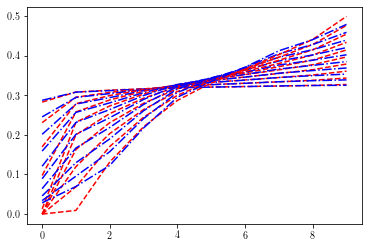

In [27]:
lk1=gridInfo.lensing_kernel()
lk2=sparse3D.lensKernel
print('shape of lensing kernel: ',lk1.shape,'=',lk2.shape)
for izl in range(0,10):
    norm1=np.sqrt(np.sum(lk1[:,izl]**2.))
    norm2=np.sqrt(np.sum(lk2[:,izl]**2.))
    print(norm1,norm2,norm1/norm2)
    plt.plot(lk1[:,izl]/norm1,'--',c='red')
    plt.plot(lk2[:,izl]/norm2,'-.',c='blue')

0.157         zh        
------------------
0.3549306876347301


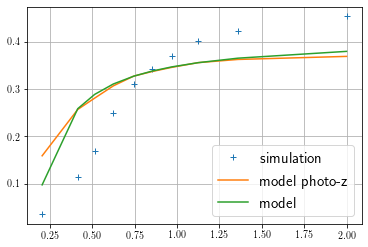

In [28]:
izl=3
halo=haloSim.nfw_lensTJ03(mass=M_200,conc=conc,redshift=z_h,ra=0.,dec=0.)
#SigmaArray=halo.Sigma(datU['raR']*3600.,datU['decR']*3600.)
lensKer= halo.lensKernel(datU['ztrue'])
kerzshow=np.zeros(gridInfo.nz)
for i in range(gridInfo.nz):
    mask=(datU['zbest']>gridInfo.zbound[i])&(datU['zbest']<=gridInfo.zbound[i+1])
    kerzshow[i]=np.average(halo.M*lensKer[mask])
norm1=np.sqrt(np.sum(kerzshow**2.))
norm2=np.sqrt(np.sum(lk1[:,izl]**2.))
norm3=np.sqrt(np.sum(lk2[:,izl]**2.))
plt.plot(gridInfo.zcgrid,kerzshow/norm1,'+',label='simulation')
plt.plot(gridInfo.zcgrid,lk2[:,izl]/norm2,label='model photo-z')
plt.plot(gridInfo.zcgrid,lk1[:,izl]/norm3,label='model')
plt.grid()
plt.legend(fontsize=15,loc='lower right')
print(sparse3D.zlBin[izl],z_h)

# sparse analysis

In [6]:
sparse3D.fista_gradient_descent(1500)

In [39]:
rsmth0=np.zeros(sparse3D.nlp,dtype=int)
rsmth0[0]=6
rsmth0[1]=4
rsmth0[2]=3
rsmth0[3:6]=2
rsmth0[6:12]=1

In [65]:
p=np.zeros(sparse3D.shapeA)
ss=sparse3D.alphaR*sparse3D._w

for izl in range(sparse3D.nlp):
    for ifr in range(sparse3D.nframe):
        if ifr==0:
            rsmth=rsmth0[izl]
        else:
            rsmth=0
        print(rsmth)
        for jsh in range(-rsmth,rsmth+1):
            dif    =   np.roll(ss[izl,ifr],jsh,axis=-2)
            for ish in range(-rsmth,rsmth+1):
                dif2=   np.roll(dif,ish,axis=-1)
                p[izl,ifr] += dif2/(2.*rsmth+1.)#**2. snr

p=np.abs(p)

p=p/sparse3D._w/sparse3D.sigmaA/w

gamma=5.
thres_adp=1./1e10
mask=(p**gamma>thres_adp)

w2=np.zeros(sparse3D.shapeA)
w2[mask]=1./(p[mask])**gamma
w2[~mask]=1./thres_adp
sparse3D.fista_gradient_descent(800,w=w2)

6
4
3
2
2
2
1
1
1
1
1
1
0
0
0
0
0
0
0
0


In [7]:
sparse3D.reconstruct()
ipv.figure()
vol1=ipv.volshow(sparse3D.deltaR,level=[0.95,0.70,0.01],opacity=[1.,0.3,0.005],extent=[[-sparse3D.ny//2,sparse3D.nx//2],[-sparse3D.ny//2,sparse3D.nx//2],[0.01,0.86]])
ipv.view(150,15,2.8)
ipv.xlabel('ra')
ipv.ylabel('dec')
ipv.zlabel('z')
ipv.show()
#ipv.pylab.savefig('./after_adaptive_frame1_smooth.png')

/work/xiangchong.li/lsstsw/miniconda/envs/lsst-scipipe/lib/python3.7/site-packages/ipyvolume/serialize.py:92: RuntimeWarning: invalid value encountered in true_divide
  gradient = gradient / np.sqrt(gradient[0] ** 2 + gradient[1] ** 2 + gradient[2] ** 2)


In [28]:
np.sum(np.abs(sparse3D.shearRRes[sparse3D.mask])**2.)/(np.sum(sparse3D.mask)-np.sum(sparse3D.alphaR>0.01))

1.0163757061191279

In [29]:
np.average(np.abs(sparse3D.shearRRes[sparse3D.mask])**2.)

1.0140928309979618

0.0
3.0540632380797255


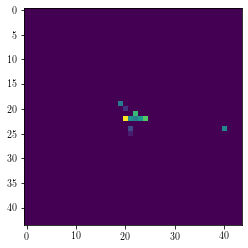

In [21]:
ishow=9
rshow=22
toshow=sparse3D.alphaR[ishow,0,48-rshow:48+rshow,48-rshow:48+rshow]#/sparse3D.mu#*ratio
plt.imshow(toshow)
print(toshow.min())
print(toshow.max())

In [19]:
ner='nn'
nn1   =  pyfits.getdata(os.path.join(hdir,'pixShearR-g1-%d-%d-%s-%s.fits' %(iz,im,zer,ner)))
nn2   =  pyfits.getdata(os.path.join(hdir,'pixShearR-g2-%d-%d-%s-%s.fits' %(iz,im,zer,ner)))
ner='wn'
wn1   =  pyfits.getdata(os.path.join(hdir,'pixShearR-g1-%d-%d-%s-%s.fits' %(iz,im,zer,ner)))
wn2   =  pyfits.getdata(os.path.join(hdir,'pixShearR-g2-%d-%d-%s-%s.fits' %(iz,im,zer,ner)))
hdir='HSC-obs/20200328/pixes/'
pn1   =  pyfits.getdata(os.path.join(hdir,'pixShearR-g1-sim%d.fits' %isim))
pn2   =  pyfits.getdata(os.path.join(hdir,'pixShearR-g2-sim%d.fits' %isim))
to1=nn1+pn1-wn1
imshow(to1[0])
print(np.abs(to1).max())

In [ ]:
# For coordinate descent based
# Three ways to get the correaltion of basis vector
ii1=7
ii2=3
ind1=sparse3D.ind1list[ii1]
ind2=sparse3D.ind1list[ii2]
print(sparse3D.get_basis_cov(ind1,ind2))
print(sparse3D.projCor[ii1,ii2])
print(sparse3D.projCor[ii2,ii1])
ind1=(13,1,71,22)
ind2=(14,2,71,21)
# 1
print(np.sum(np.conjugate(sparse3D.get_basis_vector(ind1))*sparse3D.get_basis_vector(ind2)).real)

# 2
a0=sparse3D.get_basis_vector(ind1)
print(sparse3D.chi2_transpose(a0)[ind2])

# 3
print(sparse3D.get_basis_cov(ind1,ind2))

# spectrum
print(sparse3D.get_basis_cov(ind1,ind1))
print(1./sparse3D.mu0[ind1])